In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#from pycaret.classification import *
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score,accuracy_score,precision_score,recall_score,auc,roc_curve,r2_score,confusion_matrix
from sklearn.metrics import precision_recall_fscore_support as score
import pickle

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Data sets/WA_Fn-UseC_-Telco-Customer-Churn.csv')

df_new = df.drop(columns =['customerID','TotalCharges'],axis = 1)

df_2 = df_new.copy()

label_encoding_columns = ['gender', 'Partner', 'Dependents', 'PaperlessBilling', 'PhoneService', 'Churn']
for column in label_encoding_columns:
    if column == 'gender':
        df_2[column] = df_2[column].map({'Female': 1, 'Male': 2})
    else: 
        df_2[column] = df_2[column].map({'Yes': 1, 'No': 0}) 
        

one_hot_encoding_columns = ['MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 
                            'TechSupport', 'StreamingTV',  'StreamingMovies', 'Contract', 'PaymentMethod']

df_2 = pd.get_dummies(df_2, columns = one_hot_encoding_columns, drop_first = True)

In [9]:
X = df_2.drop(columns='Churn')
y = df_2.loc[:, 'Churn']
#print(X.columns)

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure',
       'PhoneService', 'PaperlessBilling', 'MonthlyCharges',
       'MultipleLines_No phone service', 'MultipleLines_Yes',
       'InternetService_Fiber optic', 'InternetService_No',
       'OnlineSecurity_No internet service', 'OnlineSecurity_Yes',
       'OnlineBackup_No internet service', 'OnlineBackup_Yes',
       'DeviceProtection_No internet service', 'DeviceProtection_Yes',
       'TechSupport_No internet service', 'TechSupport_Yes',
       'StreamingTV_No internet service', 'StreamingTV_Yes',
       'StreamingMovies_No internet service', 'StreamingMovies_Yes',
       'Contract_One year', 'Contract_Two year',
       'PaymentMethod_Credit card (automatic)',
       'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check'],
      dtype='object')


In [10]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=40, shuffle=True, stratify = y)


from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()

clf = model.fit(X_train,y_train)

predictions = clf.predict(X_test)


    KPI Name  KPI Value (0) %  KPI Value (1) %
0  Precision            83.36            59.80
1     Recall            85.37            51.61
2         f1            85.37            51.61


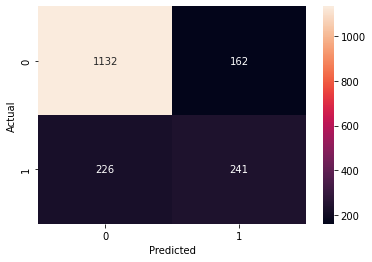

In [12]:
#evaluation
precision, recall, f1, _ = score(y_test, predictions)

df_kpi = pd.DataFrame( columns=['KPI Name','KPI Value (0) %','KPI Value (1) %'])

df_kpi = df_kpi.append({'KPI Name': 'Precision', 'KPI Value (0) %': round(precision[0]*100,2),
                           'KPI Value (1) %': round(precision[1]*100,2)}, ignore_index=True)

df_kpi = df_kpi.append({'KPI Name': 'Recall', 'KPI Value (0) %': round(f1[0]*100,2),
                           'KPI Value (1) %': round(recall[1]*100,2)}, ignore_index=True)

df_kpi = df_kpi.append({'KPI Name': 'f1', 'KPI Value (0) %': round(f1[0]*100,2),
                           'KPI Value (1) %': round(recall[1]*100,2)}, ignore_index=True)

 
confusion_matrix1 = pd.crosstab(y_test, predictions, rownames=['Actual'], colnames=['Predicted'])

sns.heatmap(confusion_matrix1, annot=True,fmt="d")

print(df_kpi)

In [13]:
!pip install interpret-community
!pip install raiwidgets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 130 kB 4.9 MB/s 
     |████████████████████████████████| 569 kB 42.6 MB/s 
     |████████████████████████████████| 6.6 MB 53.4 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.3 MB 5.1 MB/s 
     |████████████████████████████████| 177 kB 66.3 MB/s 
     |████████████████████████████████| 130 kB 71.1 MB/s 
     |████████████████████████████████| 5.8 MB 48.1 MB/s 
     |████████████████████████████████| 792 kB 73.0 MB/s 
     |████████████████████████████████| 150 kB 71.8 MB/s 
     |████████████████████████████████| 251 kB 58.5 MB/s 
     |████████████████████████████████| 1.6 MB 49.3 MB/s 
     |████████████████████████████████| 213 kB 63.5 MB/s 
     |████████████████████████████████| 3.3 MB 56.0 MB/s 
     |████████████████████████████████| 3.4 MB 35.

In [15]:
from raiwidgets import ErrorAnalysisDashboard
from raiwidgets import ExplanationDashboard
from interpret_community import TabularExplainer
from interpret_community.common.constants import ShapValuesOutput, ModelTask

In [ ]:
classes = data_transformed['Churn'].tolist()

In [16]:
explainer = TabularExplainer(clf, 
                             initialization_examples=X_train, 
                             features=X_train.columns, 
                             classes=['0','1'], #binary classification(classes are encoded) 
                             model_task= ModelTask.Classification
                             )

In [17]:
global_explanation = explainer.explain_global(X_test)

In [18]:
ErrorAnalysisDashboard(global_explanation, clf, dataset=X_test, true_y=y_test)

ErrorAnalysis started at http://localhost:5000



PYDEV DEBUGGER WARNING:
sys.settrace() should not be used when the debugger is being used.
This may cause the debugger to stop working correctly.
If this is needed, please check: 
http://pydev.blogspot.com/2007/06/why-cant-pydev-debugger-work-with.html
to see how to restore the debug tracing back correctly.
Call Location:
  File "/usr/local/lib/python3.7/dist-packages/gevent/threadpool.py", line 157, in _before_run_task
    _sys.settrace(_get_thread_trace())


PYDEV DEBUGGER WARNING:
sys.settrace() should not be used when the debugger is being used.
This may cause the debugger to stop working correctly.
If this is needed, please check: 
http://pydev.blogspot.com/2007/06/why-cant-pydev-debugger-work-with.html
to see how to restore the debug tracing back correctly.
Call Location:
  File "/usr/local/lib/python3.7/dist-packages/gevent/threadpool.py", line 162, in _after_run_task
    _sys.settrace(None)

